## Load data

In [18]:
import re
import nltk
import string
import unicodedata
import csv
import pandas as pd
import matplotlib.pyplot as plt
from nltk.corpus import stopwords
from nltk import sentiment
from nltk import word_tokenize
from wordcloud import WordCloud
from pandas_profiling import ProfileReport
from sklearn.feature_extraction.text import CountVectorizer
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from sklearn.feature_extraction.text import TfidfVectorizer


In [19]:
path_file = "data.csv"
data = pd.read_csv(path_file,  encoding='utf8', low_memory=False )

In [20]:
data.shape

(3691, 12)

In [21]:
data.head()

,_id,file_id,date,sentence_id,topic,report_receipt_at,text,url,judicature,participants,vocabulary,collective
0,corteconstitucional_T-017/12,T-3140852,2012-01-20T00:00:00.000Z,T-017/12,"Estabilidad laboral reforzada, debido proceso,...",2012-08-08,REPÚBLICA DE COLOMBIA\n\n\nSentencia T-017/12\...,https://www.corteconstitucional.gov.co/relator...,"[{""name"":""MARÍA VICTORIA CALLE CORREA"",""rol"":""...","[{""name"":""ANA JULIA GARZON GUERRERO"",""role"":""P...","[{""text"":""república"",""qty"":3},{""text"":""colombi...","[{""text"":""república"",""label"":""MISC"",""qty"":1},{..."
1,corteconstitucional_T-016/12,T-3183107,2012-01-20T00:00:00.000Z,T-016/12,Debido proceso. Tutela contra providencia jud...,2012-05-18,REPÚBLICA DE COLOMBIA\n\n\nSentencia\r\nT-016/...,https://www.corteconstitucional.gov.co/relator...,"[{""name"":""MARÍA VICTORIA CALLE CORREA"",""rol"":""...","[{""name"":""MARIA YOLANDA MONTOYA BENITEZ"",""role...","[{""text"":""república"",""qty"":3},{""text"":""colombi...",NaN
2,corteconstitucional_T-014/12,T-3187308,2012-01-20T00:00:00.000Z,T-014/12,"Mínimo vital, seguridad social. A través de l...",2013-05-07,REPÚBLICA DE COLOMBIA\n\n\nSentencia\r\nT-014/...,https://www.corteconstitucional.gov.co/relator...,"[{""name"":""JUAN CARLOS HENAO PÉREZ"",""rol"":""PONE...","[{""name"":""HECTOR FABIO RODRIGUEZ VENEGAS REPRE...","[{""text"":""república"",""qty"":3},{""text"":""colombi...",NaN
3,corteconstitucional_T-015/12,T-3182540,2012-01-20T00:00:00.000Z,T-015/12,Debido proceso. Tutela contra providencia judi...,2012-05-18,REPÚBLICA DE COLOMBIA\n\n\nSentencia T-015/12\...,https://www.corteconstitucional.gov.co/relator...,"[{""name"":""MARÍA VICTORIA CALLE CORREA"",""rol"":""...","[{""name"":""LUZ MIRIAM HIGUITA DE CANTOR"",""role""...","[{""text"":""república"",""qty"":3},{""text"":""colombi...",NaN
4,corteconstitucional_T-012/11,T-2719663,2011-01-14T00:00:00.000Z,T-012/11,"Petición, dignidad humana, salud en conexidad ...",2011-05-10,REPÚBLICA DE COLOMBIA\n\n\nSentencia T-012/11\...,https://www.corteconstitucional.gov.co/relator...,"[{""name"":""MARÍA VICTORIA CALLE CORREA"",""rol"":""...","[{""name"":""MARIA DEL CARMEN ZABALA LOPEZ"",""role...","[{""text"":""república"",""qty"":3},{""text"":""colombi...",NaN


In [22]:
data.iloc[0]

_id                                       corteconstitucional_T-017/12
file_id                                                      T-3140852
date                                          2012-01-20T00:00:00.000Z
sentence_id                                                   T-017/12
topic                Estabilidad laboral reforzada, debido proceso,...
report_receipt_at                                           2012-08-08
text                 REPÚBLICA DE COLOMBIA\n\n\nSentencia T-017/12\...
url                  https://www.corteconstitucional.gov.co/relator...
judicature           [{"name":"MARÍA VICTORIA CALLE CORREA","rol":"...
participants         [{"name":"ANA JULIA GARZON GUERRERO","role":"P...
vocabulary           [{"text":"república","qty":3},{"text":"colombi...
collective           [{"text":"república","label":"MISC","qty":1},{...
Name: 0, dtype: object

In [23]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3691 entries, 0 to 3690
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   _id                3691 non-null   object
 1   file_id            3674 non-null   object
 2   date               3691 non-null   object
 3   sentence_id        3691 non-null   object
 4   topic              3640 non-null   object
 5   report_receipt_at  3691 non-null   object
 6   text               3691 non-null   object
 7   url                3691 non-null   object
 8   judicature         3691 non-null   object
 9   participants       3684 non-null   object
 10  vocabulary         3691 non-null   object
 11  collective         1 non-null      object
dtypes: object(12)
memory usage: 346.2+ KB


In [24]:
from datetime import  datetime

In [25]:
data["date"] = pd.to_datetime(data["date"].str.slice(stop=10), infer_datetime_format=True)
data["report_receipt_at"] = pd.to_datetime(data.report_receipt_at)

In [26]:
data.describe(datetime_is_numeric=True)

,date,report_receipt_at
count,3691,3691
mean,2014-10-12 07:15:47.060417280,2015-01-16 15:19:33.340557824
min,2009-02-01 00:00:00,1969-12-31 00:00:00
25%,2012-05-25 00:00:00,2012-10-05 00:00:00
50%,2014-02-03 00:00:00,2015-02-11 00:00:00
75%,2017-02-17 00:00:00,2017-05-05 00:00:00
max,2019-10-08 00:00:00,2020-03-15 00:00:00


In [27]:
data.describe(datetime_is_numeric=True).to_latex()

'\\begin{tabular}{lll}\n\\toprule\n{} &                           date &              report\\_receipt\\_at \\\\\n\\midrule\ncount &                           3691 &                           3691 \\\\\nmean  &  2014-10-12 07:15:47.060417280 &  2015-01-16 15:19:33.340557824 \\\\\nmin   &            2009-02-01 00:00:00 &            1969-12-31 00:00:00 \\\\\n25\\%   &            2012-05-25 00:00:00 &            2012-10-05 00:00:00 \\\\\n50\\%   &            2014-02-03 00:00:00 &            2015-02-11 00:00:00 \\\\\n75\\%   &            2017-02-17 00:00:00 &            2017-05-05 00:00:00 \\\\\nmax   &            2019-10-08 00:00:00 &            2020-03-15 00:00:00 \\\\\n\\bottomrule\n\\end{tabular}\n'

In [28]:
import json
array_col = ["judicature", "participants", "collective", "vocabulary"]
for col in array_col:
  not_null_file = ~(data[col].isnull() | data[col].isna())
  data.loc[not_null_file, [col]] = data[not_null_file][col].apply(json.loads)

d:\Jorge\U Nacional\MD\Proyecto\mining_judgments\env\lib\site-packages\pandas\core\internals\blocks.py:983: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr_value = np.array(value)


In [29]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Lenovo\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [30]:
tokenizer = nltk.WordPunctTokenizer()
# tokenizer = word_tokenize()

stop_words = nltk.corpus.stopwords.words('spanish')

def remove_accents(input_str:str, lower=True):

  if input_str is None:
    return ''

  pattern = re.compile('[^\sa-zA-Z0-9]+', re.UNICODE)
  if lower:
    input_str =input_str.lower() 
  nfkd_form = unicodedata.normalize('NFKD', input_str)
  return u"".join((c for c in pattern.sub("", nfkd_form) if not unicodedata.combining(c)))


def preprocessing(doc:str, tokenizer, stop_words):
  # Se convierten los téxtos a minúsculas
  doc = remove_accents(doc)
  # Se separan signos de puntuación
  tokens = tokenizer.tokenize(doc)
  # Se eliminan las stopwords
  tokens = [token for token in tokens if token not in stop_words and not token.isnumeric() and len(token)>2]
  # Retornamos una versión filtrada del texto
  return ' '.join(tokens)

In [31]:
data["norm_text"] = data["text"].apply(lambda x: preprocessing(x, tokenizer, stop_words))

In [32]:
data.tail()

,_id,file_id,date,sentence_id,topic,report_receipt_at,text,url,judicature,participants,vocabulary,collective,norm_text
3686,corteconstitucional_T-205/19,T-6960341,2019-05-16,T-205/19,DERECHO A LA EDUCACION INCLUSIVA Y EL DEBER DE...,2019-05-22,Sentencia T-205/19\n \nDERECHO A LA EDUCACION ...,https://www.corteconstitucional.gov.co/relator...,"[{'name': 'ANTONIO JOSÉ LIZARAZO OCAMPO', 'rol...",[{'name': 'PERSONERO MUNICIPAL DE VILLA DE LEY...,"[{'text': 'sentencia', 'qty': 24}, {'text': 'd...",NaN,sentencia t20519 derecho educacion inclusivade...
3687,corteconstitucional_T-199/19,T-7147012,2019-05-15,T-199/19,DERECHO A LA SEGURIDAD PERSONAL DE PERIODISTAS...,2019-05-17,Sentencia T-199/19\n \nACCION DE TUTELA CONTRA...,https://www.corteconstitucional.gov.co/relator...,"[{'name': 'GLORIA STELLA ORTIZ DELGADO', 'rol'...","[{'name': 'HERLEY RAMIREZ ALZATE', 'role': 'PL...","[{'text': 'sentencia', 'qty': 28}, {'text': 'a...",NaN,sentencia t19919 accion tutela acto administra...
3688,corteconstitucional_T-192/19,T-7103649,2019-05-13,T-192/19,AFILIACION AL REGIMEN SUBSIDIADO DE POBLACION ...,2019-05-15,Sentencia T-192/19\n \nAFILIACION AL REGIMEN S...,https://www.corteconstitucional.gov.co/relator...,"[{'name': 'GLORIA STELLA ORTIZ DELGADO', 'rol'...",[{'name': 'MARIA RUTH PESCADOR CHALARCA COMO A...,"[{'text': 'sentencia', 'qty': 36}, {'text': 'a...",NaN,sentencia t19219 afiliacion regimen subsidiado...
3689,corteconstitucional_T-153/19,T-7056143,2019-04-03,T-153/19,DERECHO FUNDAMENTAL A LA PROPIEDAD COLECTIVA D...,2019-04-05,Sentencia T-153/19\n \nCOMUNIDADES INDIGENAS-L...,https://www.corteconstitucional.gov.co/relator...,"[{'name': 'ALBERTO ROJAS RÍOS', 'rol': 'PONENT...",[{'name': 'LUIS HERNANDO TANDIOY CHASOY EN REP...,"[{'text': 'sentencia', 'qty': 4}, {'text': 'co...",NaN,sentencia t15319 comunidades indigenaslegitima...
3690,corteconstitucional_T-154/19,T-7076731,2019-04-04,T-154/19,ACCION DE TUTELA CONTRA PROVIDENCIAS JUDICIALE...,2019-04-09,Sentencia T-154/19\n \nACCION DE TUTELA CONTRA...,https://www.corteconstitucional.gov.co/relator...,"[{'name': 'GLORIA STELLA ORTIZ DELGADO', 'rol'...",[{'name': 'BLANCA NIEVES HERNANDEZ CASTELLANOS...,"[{'text': 'sentencia', 'qty': 36}, {'text': 'a...",NaN,sentencia t15419 accion tutela providencias ju...


In [33]:
%matplotlib inline
from nltk.tokenize import word_tokenize

from collections import Counter
import numpy as np
import matplotlib.pyplot as plt

In [34]:
def calculate_counts(corpus):
  counts = Counter()
  vocabulary_count = []
  doc_count = []
  for text in corpus:
    tokens = [w for w in tokenizer.tokenize(text)]
    vocabulary_count.append(len(set(tokens)))
    doc_count.append(len(tokens))
    counts.update(tokens)
  
  return (counts, doc_count, vocabulary_count)

counts, doc_count, vocabulary_count = calculate_counts(data["norm_text"])

In [35]:
def plot_histogram(counts, doc_count, vocabulary_count, limit=100):
  
  labels, values = zip(*counts.items())
  # sort your values in descending order
  indSort = np.argsort(values)[::-1]
  print(f"Total words: {np.sum(indSort):,}")
  print(f"Total vocabulary: {len(labels):,}")
  # rearrange your data
  labels = np.array(labels)[indSort]
  values = np.array(values)[indSort]
  indexes = np.arange(len(labels))
  plt.figure(figsize=(30,10))
  plt.bar(indexes[:limit], values[:limit])
  plt.xticks(indexes[:limit], labels[:limit])
  plt.xticks(rotation=90)
  plt.title("Most commons Words")
  plt.xlabel("Words")
  plt.ylabel("Frecuency")
  plt.show()

  wc = WordCloud(
        stopwords=stopwords.words("spanish"), 
        background_color="white", 
        colormap="Dark2",
        max_font_size=180, 
        random_state=42
    )
  
  wc.generate_from_frequencies(counts)
  plt.figure(figsize=(10,8))
  plt.imshow(wc, interpolation="bilinear")
  plt.axis("off")
  plt.show()


  print(f"Mean word by document: {np.mean(doc_count)}")
  print(f"Median word by document: {np.median(doc_count)}")
  print(f"Standar desviation word by document: {np.std(doc_count)}")
  plt.figure(figsize=(10,8))
  plt.hist(doc_count, bins='fd')
  plt.title("Words by document")
  plt.ylabel("Count documents")
  plt.xlabel("Count words")
  plt.xticks(rotation=90)
  plt.show()

  print(f"Mean word by document: {np.mean(vocabulary_count)}")
  print(f"Median word by document: {np.median(vocabulary_count)}")
  print(f"Standar desviation word by document: {np.std(vocabulary_count)}")
  plt.figure(figsize=(10,8))
  plt.hist(x=vocabulary_count, bins='fd')
  plt.title("Vocabulary by document")
  plt.ylabel("Count documents")
  plt.xlabel("Count words")
  plt.xticks(rotation=90)
  plt.show()

Total words: 33,921,138,345
Total vocabulary: 260,466


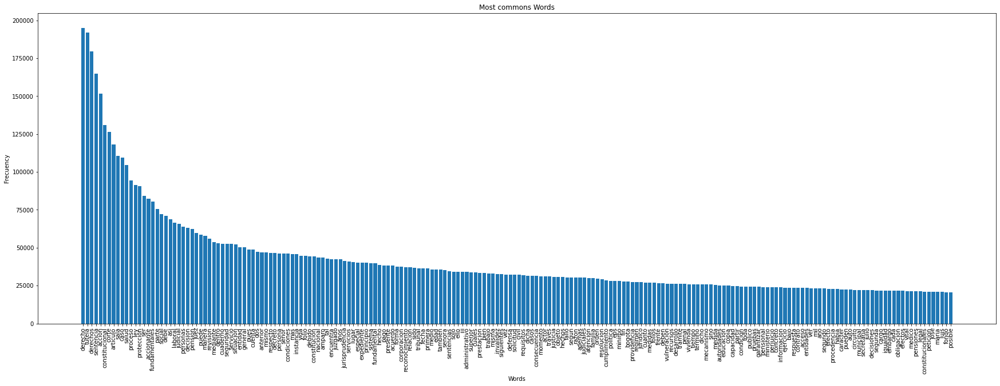

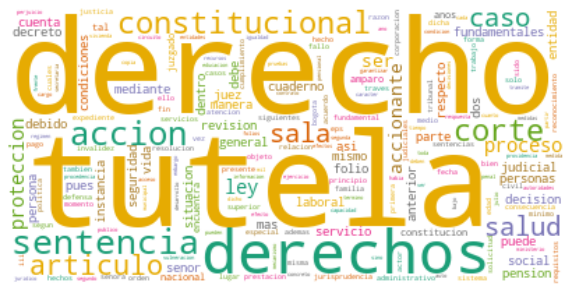

Mean word by document: 7144.679761582227
Median word by document: 5876.0
Standar desviation word by document: 5721.920801912977


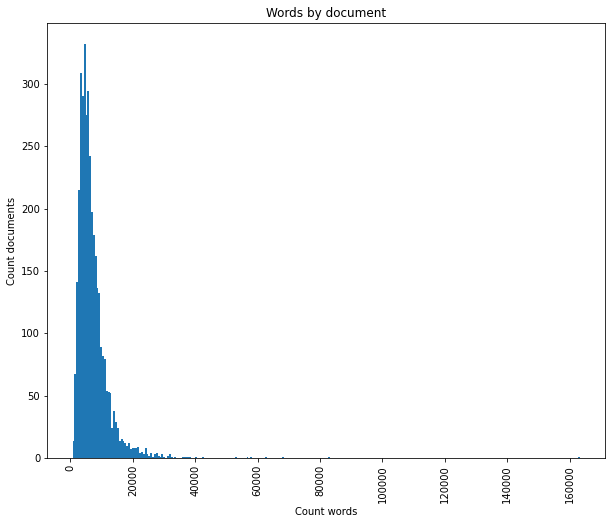

Mean word by document: 1981.0208615551342
Median word by document: 1807.0
Standar desviation word by document: 895.1610377461078


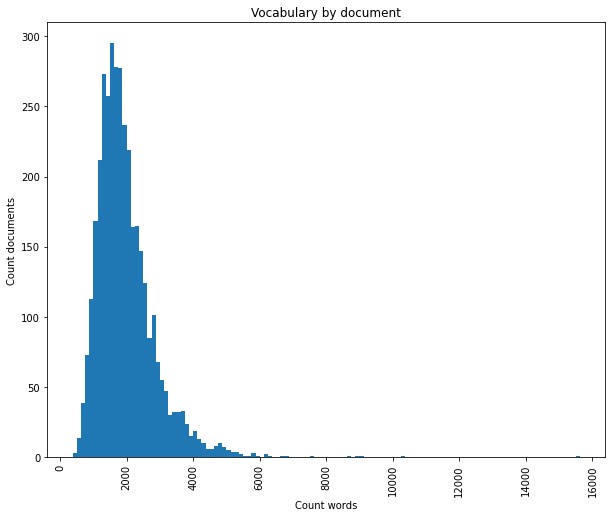

In [36]:
plot_histogram(counts, doc_count, vocabulary_count, limit=200)

In [37]:
max_features = int(np.mean(vocabulary_count)+2*np.std(vocabulary_count))
max_features

3771

In [38]:
tfidf=TfidfVectorizer(max_features=max_features, max_df=0.5, sublinear_tf=True)
tfidf.fit(data["norm_text"])
X_tfidf=tfidf.transform(data["norm_text"]).toarray()
print("La representación TF-IDF es de tamaño: {}".format(X_tfidf.shape))
pd.DataFrame(data=X_tfidf, columns=tfidf.get_feature_names())

La representación TF-IDF es de tamaño: (3691, 3771)


,abandonar,abandono,abierta,abiertamente,abierto,abogado,abordar,abordara,absoluta,absolutamente,...,vulneren,wayuu,web,william,yepes,yopal,zapata,zona,zonal,zonas
0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.025874,0.000000,0.037084,0.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.00000,0.000000
1,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.00000,0.000000
2,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.026898,...,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.00000,0.000000
3,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.0,0.0,0.0,0.030171,0.0,0.0,0.000000,0.00000,0.000000
4,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.00000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3686,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.00000,0.000000
3687,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.018165,0.000000,0.018213,...,0.000000,0.0,0.0,0.0,0.022177,0.0,0.0,0.052863,0.00000,0.073624
3688,0.0,0.0,0.0,0.0,0.000000,0.000000,0.016679,0.000000,0.000000,0.000000,...,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.00000,0.000000
3689,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.021271,0.000000,0.000000,...,0.023104,0.0,0.0,0.0,0.000000,0.0,0.0,0.034035,0.00000,0.022160


In [39]:
bow=CountVectorizer(max_features=max_features)
bow.fit(data["norm_text"])
X_bow=bow.transform(data["norm_text"]).toarray()
print("La representación BOW es de tamaño: {}".format(X_bow.shape))

La representación BOW es de tamaño: (3691, 3771)


In [40]:
pd.DataFrame(data=X_bow, columns=bow.get_feature_names())

,abandono,abiertamente,abogado,abordar,abril,absoluta,absolutamente,absoluto,abstenerse,abstracto,...,vulnerar,vulneraron,vulnero,wayuu,web,yopal,zapata,zona,zonal,zonas
0,0,0,0,1,5,2,0,0,0,0,...,1,1,1,0,0,0,0,0,0,0
1,0,0,0,0,5,0,0,0,0,1,...,0,0,6,0,0,0,0,0,0,0
2,0,0,0,0,5,0,1,0,0,0,...,0,0,1,0,0,0,0,0,0,0
3,0,0,0,0,2,0,0,0,0,0,...,3,0,7,0,0,0,0,0,0,0
4,0,0,0,0,10,0,0,0,0,0,...,0,0,2,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3686,0,0,0,0,11,0,0,0,0,0,...,0,0,3,0,0,0,0,0,0,0
3687,0,0,0,0,1,0,1,0,0,1,...,0,0,6,0,0,0,0,8,0,18
3688,0,0,0,1,3,0,0,0,0,0,...,0,1,6,0,0,0,0,0,0,0
3689,0,0,0,0,1,0,0,0,0,1,...,0,2,1,0,0,0,0,2,0,1


In [63]:
from sklearn.cluster import AffinityPropagation

# Instanciamos el modelo
clf = AffinityPropagation(damping=0.9, random_state=42)
# Entrenamos el modelo con el dataset sintético
clf.fit(X_tfidf)
print(f"Number of cluster with TF-IDF: {len(clf.cluster_centers_)}")

Number of cluster with TF-IDF: 268


In [43]:
max_words = int(np.mean(doc_count)+2*np.std(doc_count))

In [44]:
from gensim.models import word2vec

feature_size = 100
window_context = 5
min_word_count = 1 
sample = 1e-3
tokenized_corpus = [tokenizer.tokenize(document) for document in data["norm_text"]]

In [64]:
# Entrenamos el modelo w2v con el corpus tokenizado
w2v_model = word2vec.Word2Vec([doc for doc in tokenized_corpus if len(doc)<=max_words],
                              window=window_context, min_count=min_word_count,
                              sample=sample
                              )

In [65]:
def w2v_repr(corpus):
    w2v_representations = []
    tokenized_corpus = [tokenizer.tokenize(document) for document in corpus]
    for sentence in tokenized_corpus:
        try:
            w2v_representations.append(w2v_model.wv[sentence].mean(axis=0))
            
        except:
            w2v_representations.append(np.zeros(shape=(feature_size,)))
    return np.array(w2v_representations)

X_w2v = w2v_repr(data["norm_text"])

In [66]:
# Instanciamos el modelo
clf = AffinityPropagation(damping=0.9, random_state=42)
# Entrenamos el modelo con el dataset sintético
clf.fit(X_w2v)
print(f"Number of cluster with W2v: {len(clf.cluster_centers_)}")

Number of cluster with W2v: 140


In [67]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, random_state=0, n_iter=1000, perplexity=2, verbose=1)
T = tsne.fit_transform(X_w2v)

[t-SNE] Computing 7 nearest neighbors...
[t-SNE] Indexed 3691 samples in 0.002s...
[t-SNE] Computed neighbors for 3691 samples in 0.415s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3691
[t-SNE] Computed conditional probabilities for sample 2000 / 3691
[t-SNE] Computed conditional probabilities for sample 3000 / 3691
[t-SNE] Computed conditional probabilities for sample 3691 / 3691
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 89.775253
[t-SNE] KL divergence after 1000 iterations: 1.320976


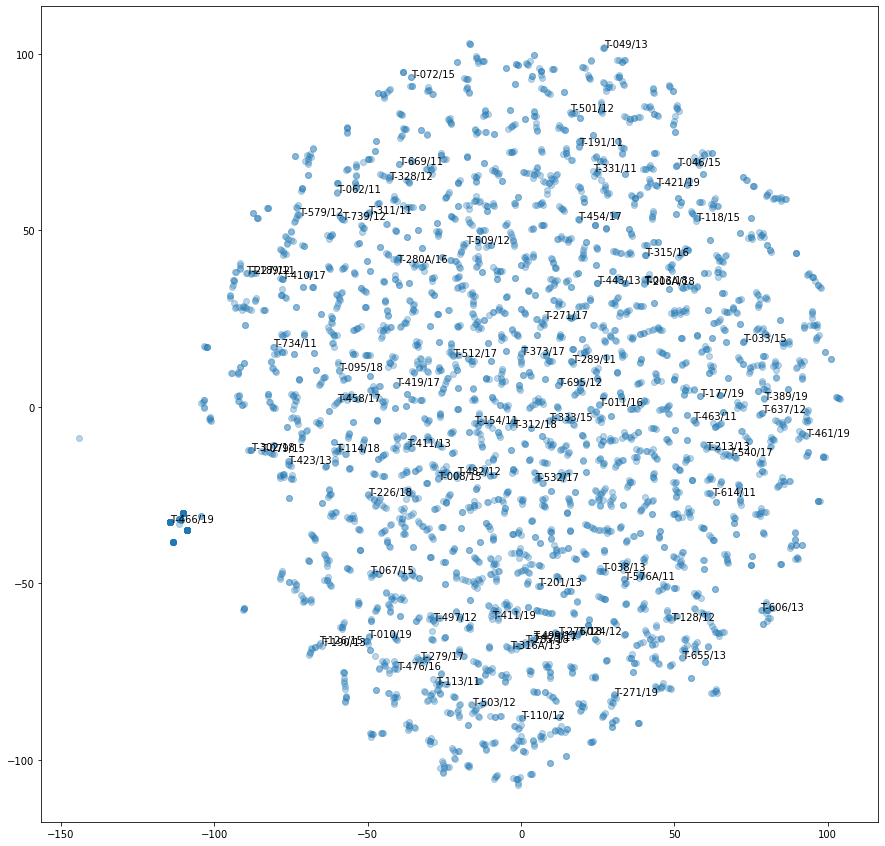

In [68]:
# Visualizamos la representación de las películas
plt.figure(figsize=(15, 15))
# Seleccionamos el número de documentos del que se mostrará el título
n_docs = 80
# Generamos una secuencia de enteros correspondiente a los índices de los documentos
idx = np.arange(len(data["norm_text"]))
# Seleccionamos de forma aleatoria n_docs documentos
valid_idx = np.random.choice(idx, replace=False, size=n_docs)
# Visualizamos todas las representaciones
plt.scatter(T[:, 0], T[:, 1], alpha=0.3)
# Seleccionamos los títulos que se van a visualizar
viz_titles = [data["sentence_id"][i] for i in valid_idx]
# Asignamos los títulos al punto correspondiente
for label, x, y in zip(viz_titles, T[valid_idx, 0], T[valid_idx, 1]):
    plt.annotate(label, xy=(x, y), xytext=(0, 0), textcoords='offset points')

In [69]:
def quitar_tildes(cadena):
    s = ''.join((c for c in unicodedata.normalize('NFD',cadena) if unicodedata.category(c) != 'Mn'))
    return s

def get_segment(row, re_str=r'[\n]+[(^i|^v)]+\.\s{0,}[(\w)]{0,}?'):
    
    texto = re.split(
        re_str, quitar_tildes(row["text"].lower())
        )
    
    decision = None

    if len(texto)<=1:
        return {"sentence_id": row["sentence_id"] , "antecedentes": '', "decision": decision}

    for i in range(3,len(texto)):
        if texto[i].startswith('decision') and not texto[i].startswith('decisiones'):
            decision = texto[i]
            break
    
    return {"sentence_id": row["sentence_id"] , "antecedentes": texto[1], "decision": decision}


In [70]:
new_data = pd.DataFrame.from_records(data.apply(get_segment, axis=1))
new_data

,sentence_id,antecedentes,decision
0,T-017/12,antecedentes\r\n\n \n1. hechos\n \n1.1.\r\nafi...,"decision\n \nen\r\nmerito de lo anterior, la s..."
1,T-016/12,antecedentes \n \nmaria\r\nyolanda montoya ben...,"decision\n \nen\r\nmerito de lo expuesto, la s..."
2,T-014/12,antecedentes\n \n1. hechos\n \n1. el 27 de jul...,decision\n \ncon\r\nfundamento en las consider...
3,T-015/12,antecedentes\r\n\n \n1. hechos\n \n1.1.\r\nafi...,"decision\n \nen\r\nmerito de lo anterior, la s..."
4,T-012/11,antecedentes\n \n1. hechos\n \nel defensor ...,"decision\n \nen merito de lo expuesto, la\r\ns..."
...,...,...,...
3686,T-205/19,antecedentes \n \n1. hechos y relato contenido...,"decision\n \nen\r\nmerito de lo expuesto, la s..."
3687,T-199/19,antecedentes\n \nherley\r\nramirez alzate pres...,"decision\n \nen merito de lo expuesto, la sala..."
3688,T-192/19,antecedentes\n \na. hechos y pretensiones\n \n...,"decision\n \nen merito de lo expuesto, la sala..."
3689,T-153/19,antecedentes\n \na. hechos relevantes\n \n1. ...,"decision\n \nen merito de lo expuesto, la sala..."


In [71]:
new_data.decision.isna().sum()

704

In [72]:
re_str = r'[\n]+[1-8]\.?\s*\n?\w*\n'
new_data2 = data[new_data.decision.isna()].apply(lambda x: get_segment(x, re_str), axis=1)


In [73]:
new_data2_df = pd.concat([pd.DataFrame.from_records(new_data2.values, index=new_data2.index), new_data[new_data.decision.notna()]])
new_data2_df

,sentence_id,antecedentes,decision
13,T-035/12,antecedentes \n \n1.1. \r\nexpediente ...,"decision \n \nen merito de lo expuesto, la\r\n..."
24,T-075/12,"\na\r\ntraves de apoderado judicial, el senor...",None
27,T-080/12,\nlos ciudadanos luis alberto rosas\r\nuribe ...,None
29,T-093/12,\n1. demanda de\r\ntutela[1]\n \n1.1.\r\nelem...,None
33,T-083/11,"\n1.1. solicitud\n \nlas accionantes, zaid...",None
...,...,...,...
3686,T-205/19,antecedentes \n \n1. hechos y relato contenido...,"decision\n \nen\r\nmerito de lo expuesto, la s..."
3687,T-199/19,antecedentes\n \nherley\r\nramirez alzate pres...,"decision\n \nen merito de lo expuesto, la sala..."
3688,T-192/19,antecedentes\n \na. hechos y pretensiones\n \n...,"decision\n \nen merito de lo expuesto, la sala..."
3689,T-153/19,antecedentes\n \na. hechos relevantes\n \n1. ...,"decision\n \nen merito de lo expuesto, la sala..."


In [74]:
df_expand= new_data2_df.decision.str.split("notifiquese,",expand=True, n=2)
new_data2_df['decision_corta'] = df_expand[0]
new_data2_df['referencias'] = df_expand[1]

In [75]:
new_data2_df["decision_corta_norm"] = new_data2_df["decision_corta"].apply(lambda x: preprocessing(x, tokenizer, stop_words))
new_data2_df["antecedentes_norm"] = new_data2_df["antecedentes"].apply(lambda x: preprocessing(x, tokenizer, stop_words))

In [76]:
counts_dc, doc_count_dc, vocabulary_count_dc = calculate_counts(new_data2_df["decision_corta_norm"])
counts_ant, doc_count_ant, vocabulary_count_ant = calculate_counts(new_data2_df["antecedentes_norm"] )

Total words: 677,064,801
Total vocabulary: 36,799


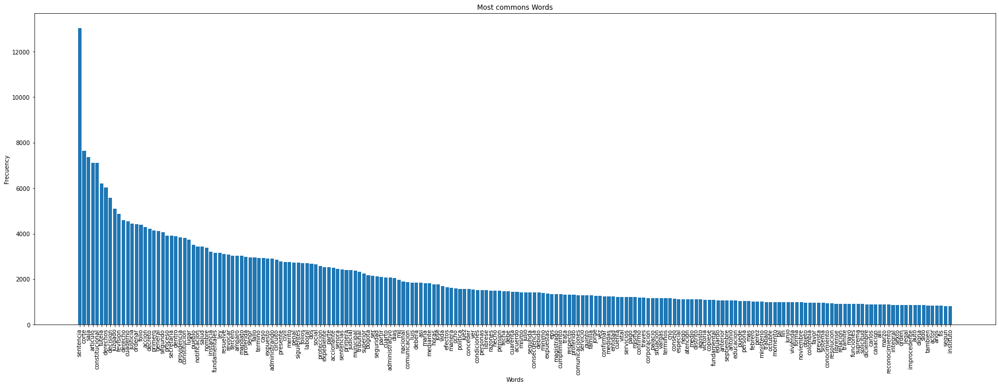

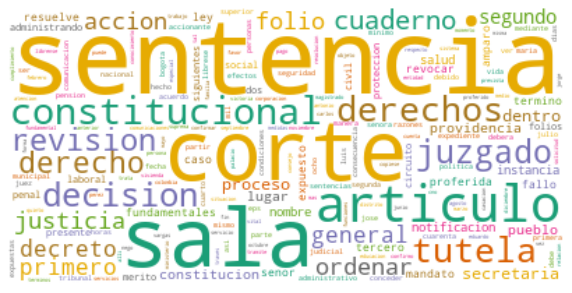

Mean word by document: 283.43971823354104
Median word by document: 121.0
Standar desviation word by document: 684.497441620705


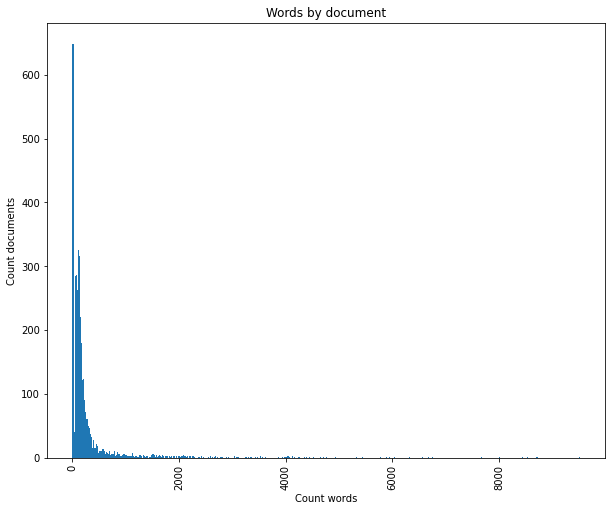

Mean word by document: 155.57057707938228
Median word by document: 100.0
Standar desviation word by document: 252.9224613087604


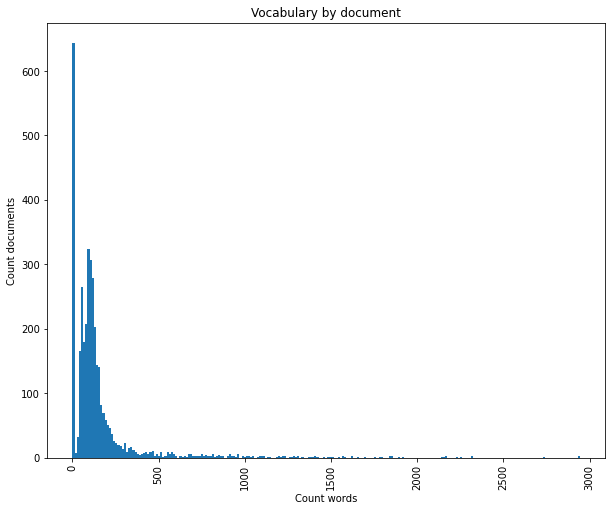

Total words: 4,667,374,036
Total vocabulary: 96,617


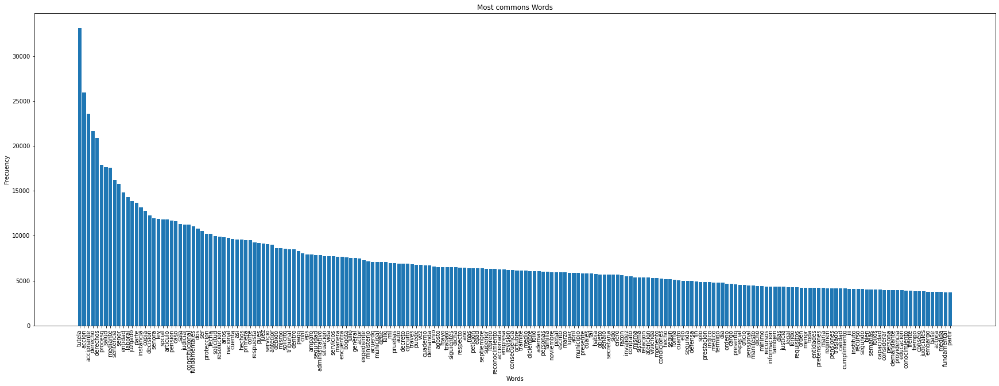

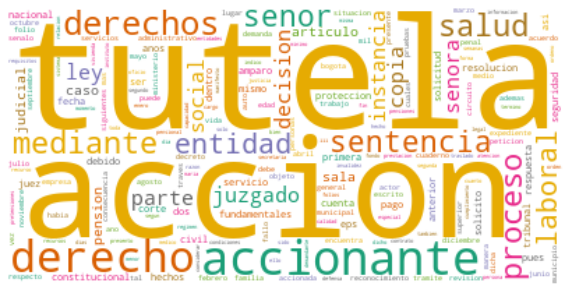

Mean word by document: 1231.112977512869
Median word by document: 885.0
Standar desviation word by document: 1406.005943656534


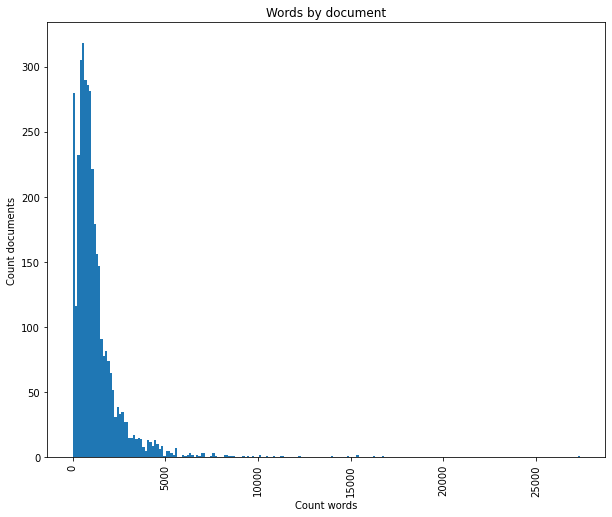

Mean word by document: 549.4026009211595
Median word by document: 462.0
Standar desviation word by document: 412.31112298066444


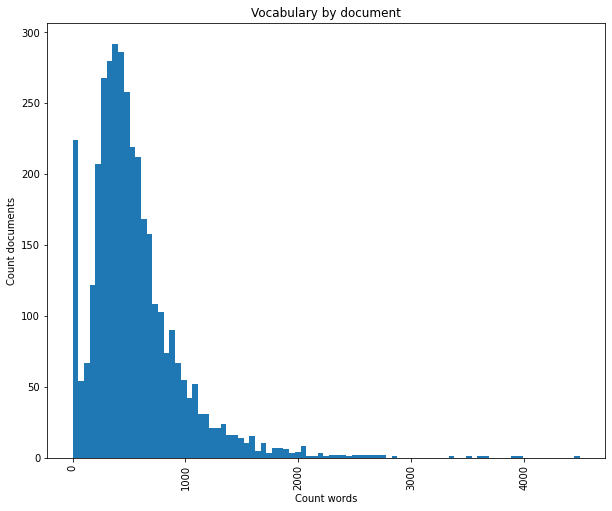

In [77]:
plot_histogram(counts_dc, doc_count_dc, vocabulary_count_dc, limit=200)
plot_histogram(counts_ant, doc_count_ant, vocabulary_count_ant, limit=200)

In [78]:
new_data3_df = new_data2_df.merge(data[["sentence_id", "text", "norm_text"]], on="sentence_id")

In [79]:
def extraer_articulos(text, topic):
    regx = f"({topic}|{topic}s)[ ]([\s\S]*?)\."
    expretion = re.compile(r"{}".format(regx))
    result = expretion.findall(text)
    for item_normalize in list(map(" ".join, result)):
        yield item_normalize

In [80]:
new_data3_df["articulos"] = new_data3_df["text"].apply(lambda x: list(extraer_articulos(quitar_tildes(x).lower(), "articulo"))) 
new_data3_df["folios"] = new_data3_df["text"].apply(lambda x: list(extraer_articulos(quitar_tildes(x).lower(), "folio"))) 
new_data3_df["decretos"] = new_data3_df["text"].apply(lambda x: list(extraer_articulos(quitar_tildes(x).lower(), "decreto"))) 
new_data3_df["sentencias"] = new_data3_df["text"].apply(lambda x: list(extraer_articulos(quitar_tildes(x).lower(), "sentencia"))) 

In [86]:
from typing import Iterable
def remove_space(word_list:Iterable[str]):
    for w in word_list:
        yield " ".join([_w.replace(",",'') for _w in word_tokenize(w)])

In [88]:
new_data3_df["articulos"] = new_data3_df["articulos"].apply(lambda x: list(remove_space(x))) 
new_data3_df["folios"] = new_data3_df["folios"].apply(lambda x: list(remove_space(x)))
new_data3_df["decretos"] = new_data3_df["decretos"].apply(lambda x: list(remove_space(x))) 
new_data3_df["sentencias"] = new_data3_df["sentencias"].apply(lambda x: list(remove_space(x)))

In [89]:
new_data3_df.iloc[0]

sentence_id                                                     T-035/12
antecedentes           antecedentes \n \n1.1.         \r\nexpediente ...
decision               decision \n \nen merito de lo expuesto, la\r\n...
decision_corta         decision \n \nen merito de lo expuesto, la\r\n...
referencias             comuniquese,\r\npubliquese en la gaceta de la...
decision_corta_norm    decision merito expuesto sala septima revision...
antecedentes_norm      antecedentes expediente solicitud walter franc...
text                   REPÚBLICA DE COLOMBIA\n\n\nSentencia T-035/12\...
norm_text              republica colombia sentencia t03512 proteccion...
articulos              [articulos 86 y 241 numeral 9° de la constituc...
folios                 [folio 11  cuaderno no 2 ), folios 12-14  cuad...
decretos               [decreto 4433/04 se consagra la pension de inv...
sentencias             [sentencia t-035/12 proteccion constitucional ...
Name: 0, dtype: object

In [90]:
new_data3_df.to_csv('split_data.csv', sep=",",quotechar='"', quoting=csv.QUOTE_ALL, encoding='utf-8')

In [6]:
new_data3_df = pd.read_csv('split_data.csv', sep=",",quotechar='"', quoting=csv.QUOTE_ALL, encoding='utf-8')

## Most Popular words by Tutela

In [ ]:
nltk.download('punkt')

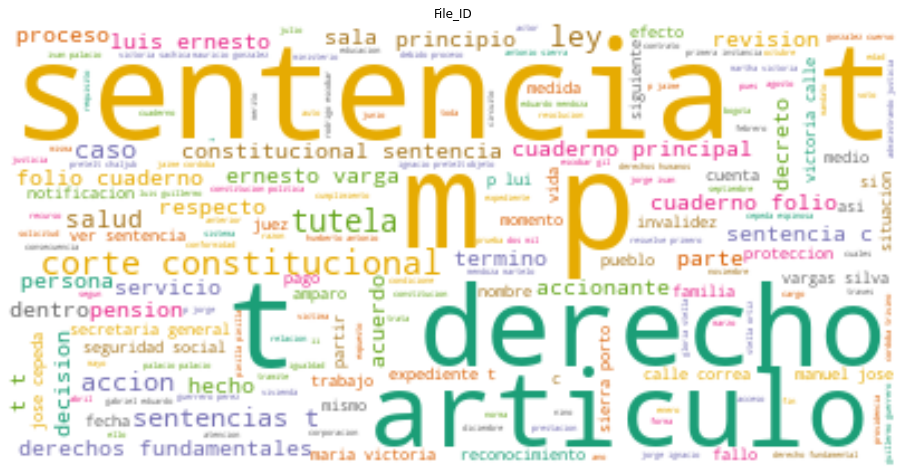

In [60]:
def nube_de_palabras2(columna):
    wc = WordCloud(
        stopwords=stopwords.words("spanish"), 
        background_color="white", 
        colormap="Dark2",
        max_font_size=180, 
        random_state=42
    )


    plt.rcParams['figure.figsize'] = [16,12]
    wc.generate(" ".join(new_data[new_data[columna].notna()][columna]))
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.title('File_ID')

    plt.show()

nube_de_palabras2('decision')

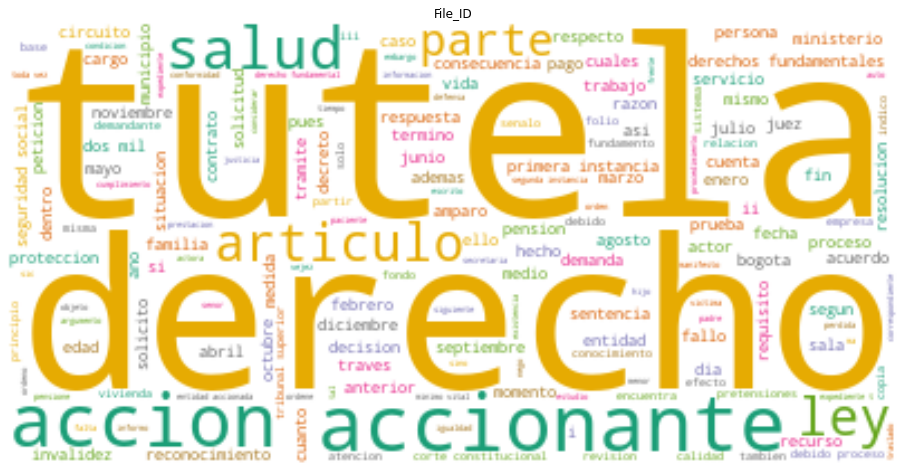

In [61]:
nube_de_palabras2('antecedentes')

In [ ]:
stop_words = set(stopwords.words("spanish"))
word_list = [w for w in word_tokenize(" ".join(new_data['antecedentes'])) if (not w in stop_words and not w.isnumeric() and len(w)>2)]

In [ ]:
counts = Counter(word_list)

In [ ]:
labels, values = zip(*counts.items())

# sort your values in descending order
indSort = np.argsort(values)[::-1]

# rearrange your data
labels = np.array(labels)[indSort]
values = np.array(values)[indSort]
indexes = np.arange(len(labels))

In [ ]:
nltk.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...


True

In [ ]:
analizador = SentimentIntensityAnalyzer()
analizador.polarity_scores("hiooasdmasasd sdfsdfsd")

{'compound': 0.0, 'neg': 0.0, 'neu': 1.0, 'pos': 0.0}

## polarity scores by Tutela

In [ ]:
def sentimientos(new_data, columna):
    sentimientos_list = []
    for index, row in new_data.iterrows():
        scores = analizador.polarity_scores(row[columna])
        sentimientos_list.append({
            f"{columna}_negative": scores['neg'], 
            f"{columna}_neutral": scores['neu'], 
            f'{columna}_positivo': scores['pos'], 
        })
    return pd.DataFrame(sentimientos_list)


In [ ]:
new_data.head()

,sentence_id,antecedentes,decision
0,T-014/12,antecedentes 1 hechos 1 el 27 de julio de ...,decision con fundamento en las consideracio...
1,T-012/11,antecedentes 1 hechos el defensor del p...,decision en merito de lo expuesto la sala p...
2,T-013/12,antecedentes el ocho 8 de junio de dos mil ...,decision en merito de lo expuesto la sala te...
3,T-012/12,antecedentes el senor juan antonio a traves ...,consideraciones de la corte constitucional 1...
4,T-024/11,antecedentes 1 hechos los hechos relatados...,decision en merito de lo expuesto la sala n...


In [ ]:
df_decision_sentimientos = sentimientos(new_data, 'decision')

In [ ]:
df_antecedentes_sentimientos = sentimientos(new_data, 'antecedentes')

In [ ]:
df_result_sentimientos = pd.concat([new_data, df_decision_sentimientos, df_antecedentes_sentimientos], axis=1, join="inner")

In [ ]:
df_result_sentimientos.shape

(1862, 9)

## New Dataframe with additional variables

In [ ]:
df_result_sentimientos.head()

,file_id,antecedentes,decision,decision_negative,decision_neutral,decision_positivo,antecedentes_negative,antecedentes_neutral,antecedentes_positivo
0,T-3187308,antecedentes 1 hechos 1 el 27 de julio de ...,decision con fundamento en las consideracio...,0.019,0.977,0.004,0.009,0.979,0.012
1,T-2719663,antecedentes 1 hechos el defensor del p...,decision en merito de lo expuesto la sala p...,0.015,0.981,0.004,0.029,0.964,0.007
2,T-3176539,antecedentes el ocho 8 de junio de dos mil ...,decision en merito de lo expuesto la sala te...,0.027,0.968,0.005,0.028,0.952,0.020
3,T-3180007,antecedentes el senor juan antonio a traves ...,consideraciones de la corte constitucional 1...,0.025,0.955,0.020,0.023,0.965,0.012
4,T-2764991 Y 2822307,antecedentes 1 hechos los hechos relatados...,decision en merito de lo expuesto la sala n...,0.027,0.959,0.014,0.018,0.976,0.006


In [ ]:
new_data.head()

,file_id,antecedentes,decision
0,T-3187308,antecedentes 1 hechos 1 el 27 de julio de ...,decision con fundamento en las consideracio...
1,T-2719663,antecedentes 1 hechos el defensor del p...,decision en merito de lo expuesto la sala p...
2,T-3176539,antecedentes el ocho 8 de junio de dos mil ...,decision en merito de lo expuesto la sala te...
3,T-3180007,antecedentes el senor juan antonio a traves ...,consideraciones de la corte constitucional 1...
4,T-2764991 Y 2822307,antecedentes 1 hechos los hechos relatados...,decision en merito de lo expuesto la sala n...


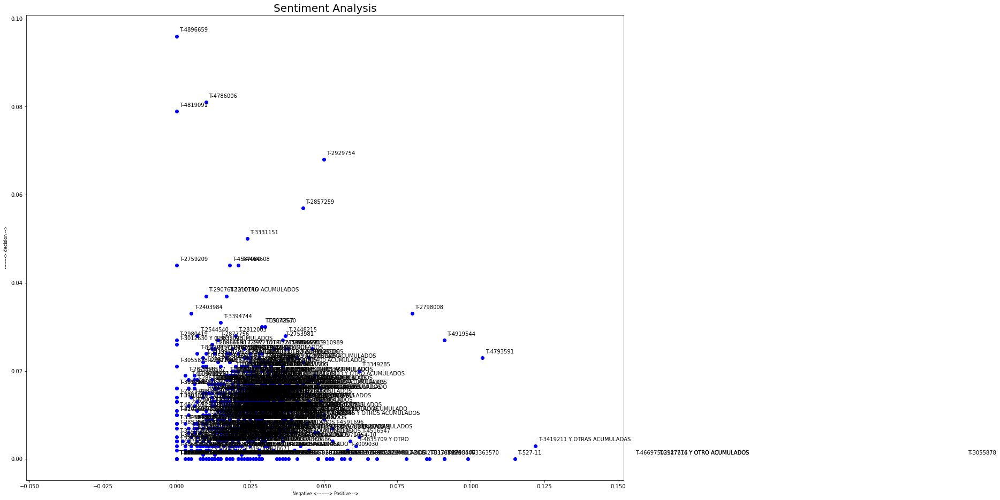

In [ ]:
plt.rcParams['figure.figsize'] = [20, 16]

for index, row in enumerate(df_result_sentimientos[1:900].index):
    x = df_result_sentimientos[1:1500].decision_negative.loc[row]
    y = df_result_sentimientos[1:1500].decision_positivo.loc[row]
    plt.scatter(x, y, color='blue')
    plt.text(x+.001, y+.001, df_result_sentimientos['file_id'][index], fontsize=10)
    plt.xlim(-0.051, 0.152) 
    
plt.title('Sentiment Analysis', fontsize=20)
plt.xlabel(' Negative <--------> Positive -->', fontsize=8)
plt.ylabel(' --------> decision -->', fontsize=8)

plt.show()

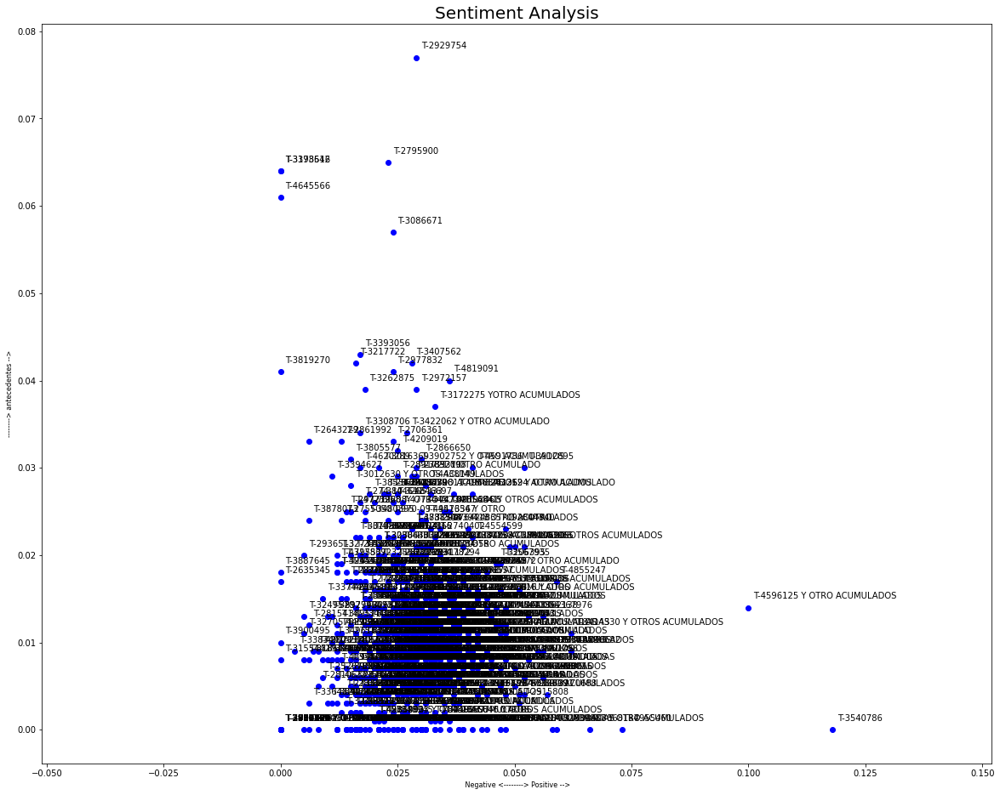

In [ ]:
plt.rcParams['figure.figsize'] = [20, 16]

for index, row in enumerate(df_result_sentimientos[1:900].index):
    x = df_result_sentimientos[1:1500].antecedentes_negative.loc[row]
    y = df_result_sentimientos[1:1500].antecedentes_positivo.loc[row]
    plt.scatter(x, y, color='blue')
    plt.text(x+.001, y+.001, df_result_sentimientos['file_id'][index], fontsize=10)
    plt.xlim(-0.051, 0.152) 
    
plt.title('Sentiment Analysis', fontsize=20)
plt.xlabel(' Negative <--------> Positive -->', fontsize=8)
plt.ylabel('--------> antecedentes -->', fontsize=8)

plt.show()

In [ ]:
##new_data.drop(['neg'], axis=1)

In [ ]:
ProfileReport(df_result_sentimientos, title="Tutelas Profiling Report")

Summarize dataset:   0%|          | 0/22 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]